<a href="https://colab.research.google.com/github/faijalamia/image-processing/blob/main/8_Brightness_and_Contrast.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [2]:
#Brighness adjustment using gamma correlation
def adjust_gamma(Image,gamma=1.0):
  #Formula: Output=(255*(input/255))^(1/gamma)
  inverse_gamma = 1/gamma
  table = np.array([((i/255)**inverse_gamma)*255 for i in np.arange(0,256)]).astype('uint8')

  return cv2.LUT(Image,table)

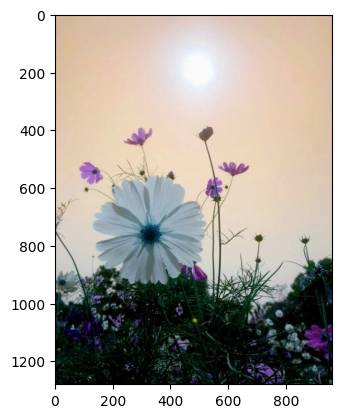

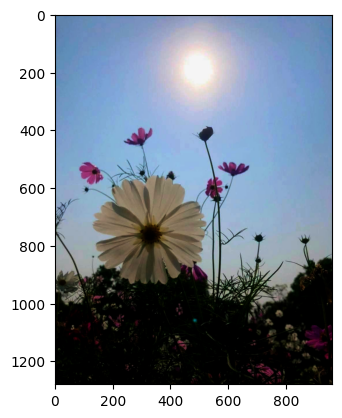

In [36]:
img = cv2.imread('/content/drive/MyDrive/flower.jpg')
plt.imshow(img)
plt.show()
img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
img_adjust_gamma = adjust_gamma(img_rgb,0.5)
plt.imshow(img_adjust_gamma)

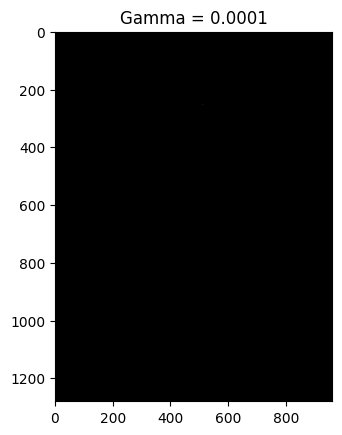

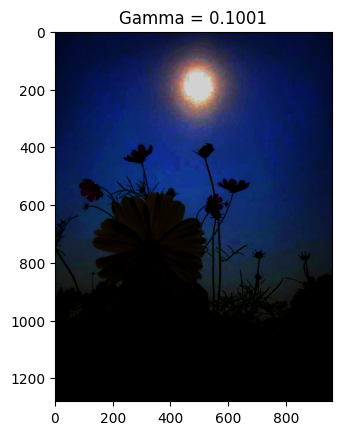

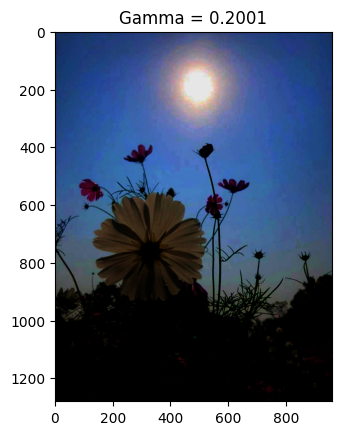

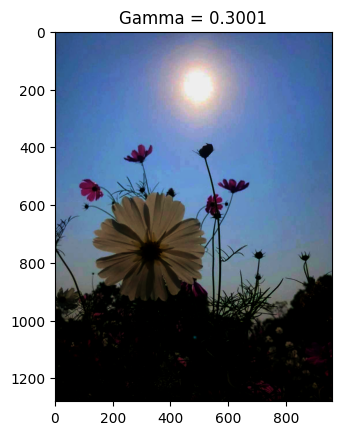

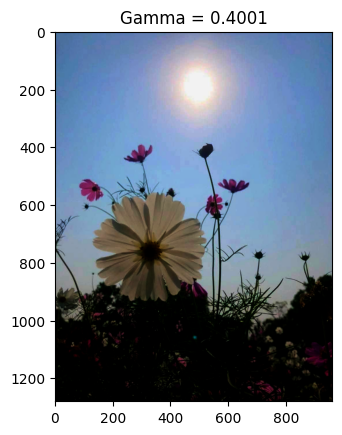

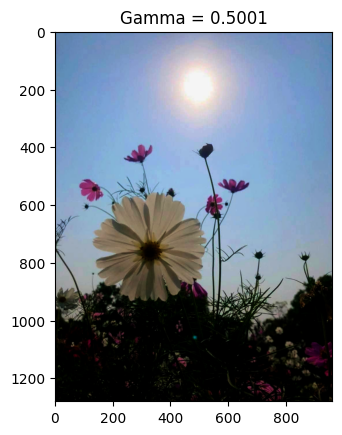

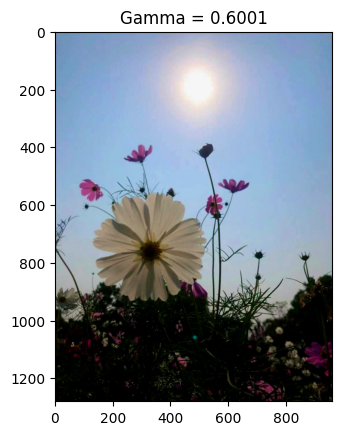

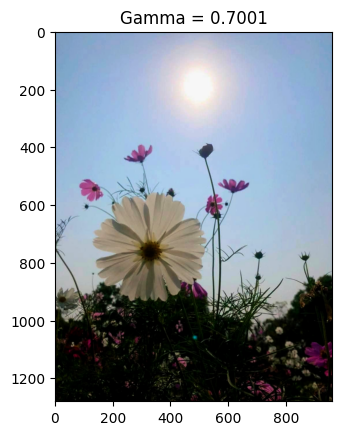

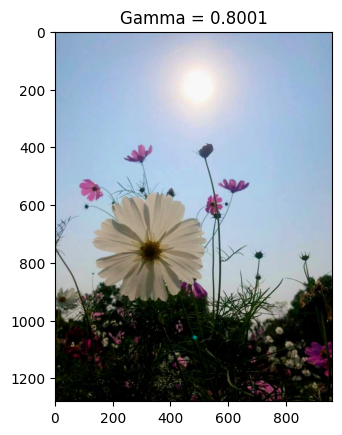

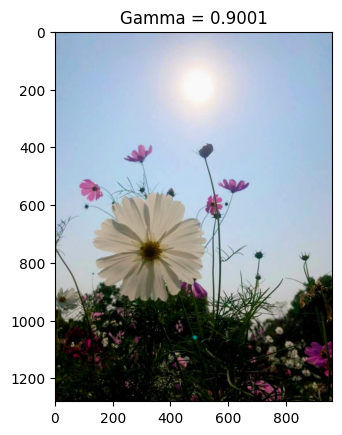

In [4]:
# Darken Shadows(Gamma<1)
# 0.0001 to <1
x = 0.0001
while x<=1.0:
  y = round(x,4)
  img_dark = adjust_gamma(img_rgb,y)
  plt.imshow(img_dark)
  plt.title(f'Gamma = {y}')
  plt.show()
  x+=0.1

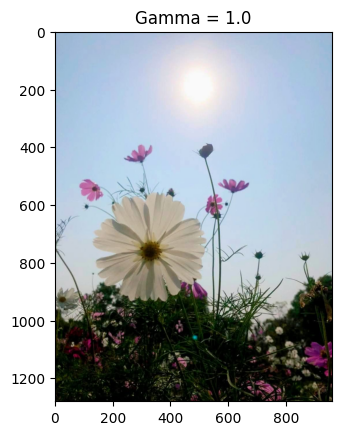

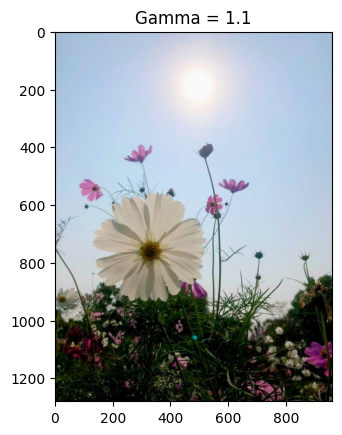

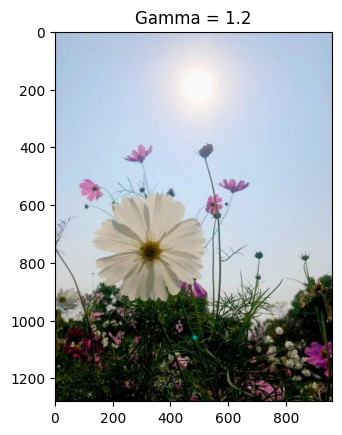

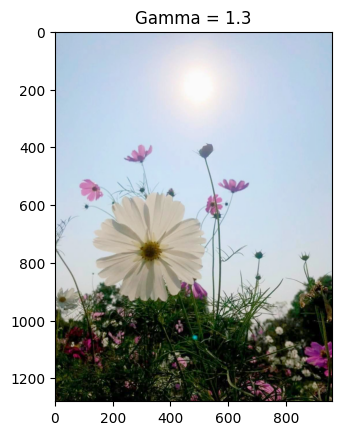

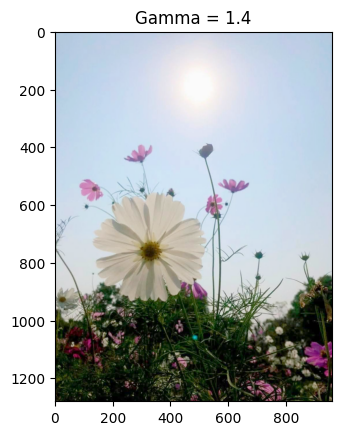

...

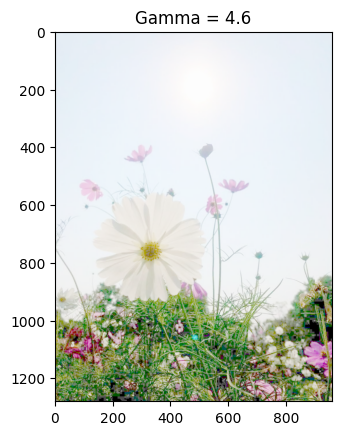

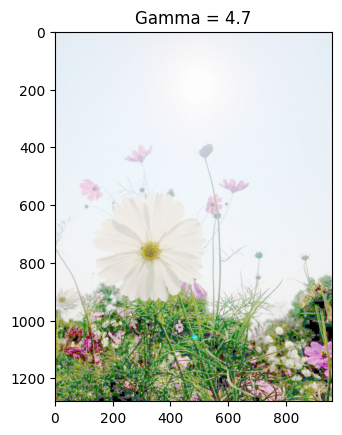

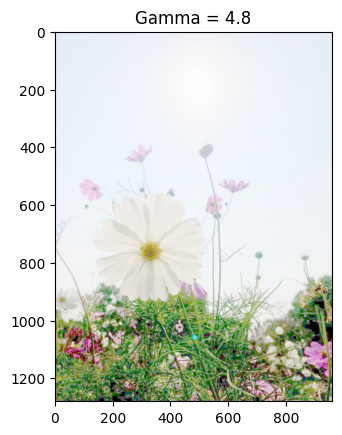

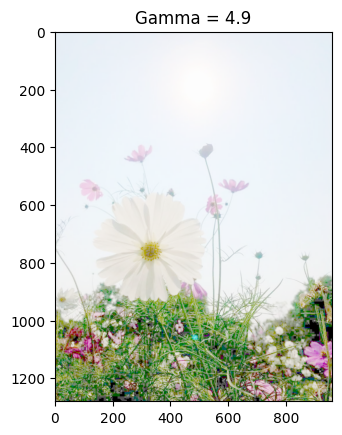

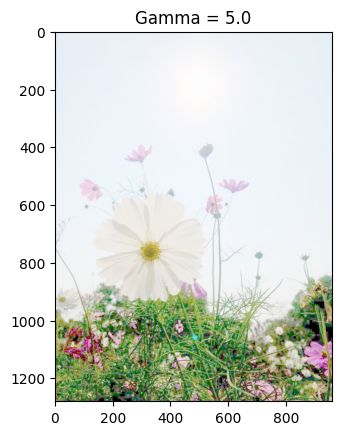

In [5]:
# Brighten The Image(Gamma>1)
x = 1.0
while x<=5.0:
  y = round(x,4)
  img_bright  = adjust_gamma(img_rgb,y)
  plt.imshow(img_bright)
  plt.title(f'Gamma = {y}')
  plt.show()
  x+=0.1


**Contrast**
1. Gray Scale
2. Adaptive Histrogram Equalization(AHE)
3. Contrast Limited Adaptive Histogram Equalization(CLAHE)


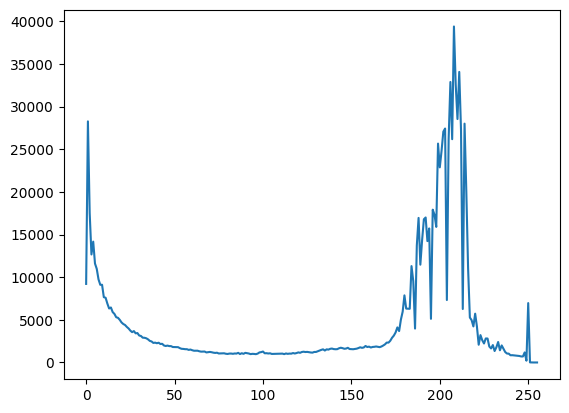

In [15]:
img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
hist = cv2.calcHist([img_gray],[0],None,[256],[0,255])
plt.plot(hist)
plt.show()

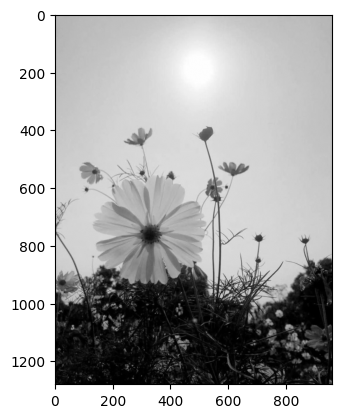

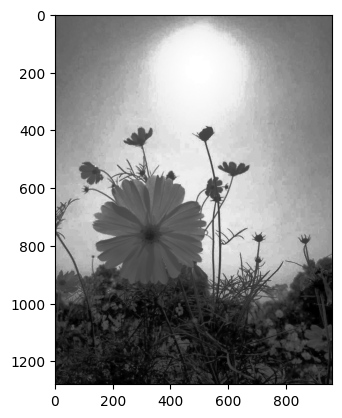

In [22]:
img_gray_hist_eq = cv2.equalizeHist(img_gray)
plt.imshow(img_gray,cmap = 'gray')
plt.show()
plt.imshow(img_gray_hist_eq,cmap='gray')
plt.show()

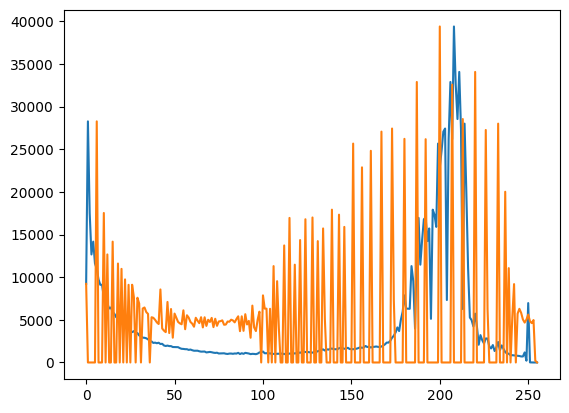

In [26]:
hist_prev_eq = cv2.calcHist([img_gray],[0],None,[256],[0,255])
plt.plot(hist_prev_eq)
#plt.title('Before Histogram Equalization')
hist_post_eq = cv2.calcHist([img_gray_hist_eq],[0],None,[256],[0,255])
plt.plot(hist_post_eq)
#plt.title('After Histogram Equalization')
plt.show()

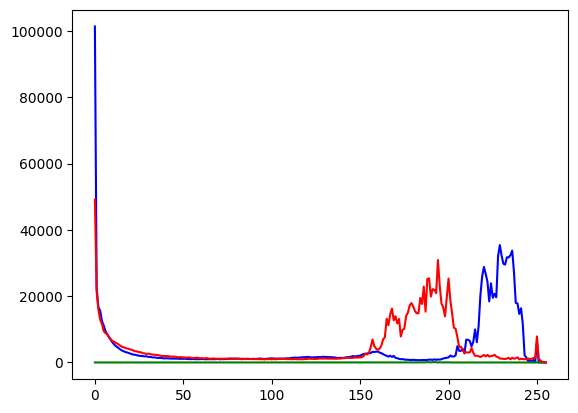

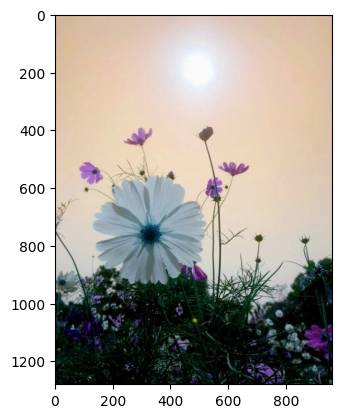

In [35]:
b,g,r = cv2.split(img)
hist = cv2.calcHist([b],[0],None,[256],[0,255])
plt.plot(hist,color='b')
hist = cv2.calcHist(g,[0],None,[256],[0,255])
plt.plot(hist,color='g')
hist = cv2.calcHist([r],[0],None,[256],[0,255])
plt.plot(hist,'r')
plt.show()
plt.imshow(img)
plt.show()

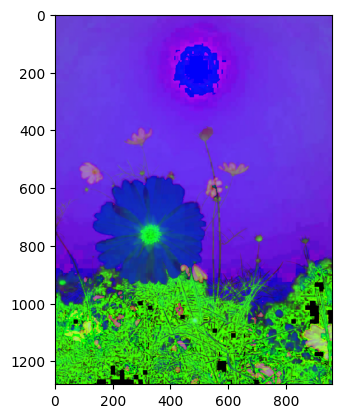

In [37]:
img_hsv = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
plt.imshow(img_hsv)

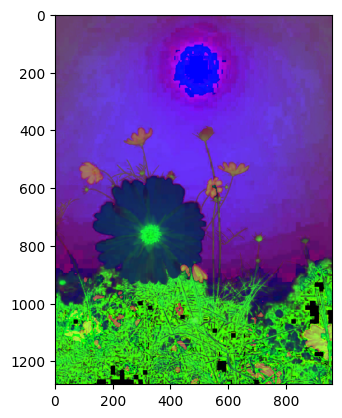

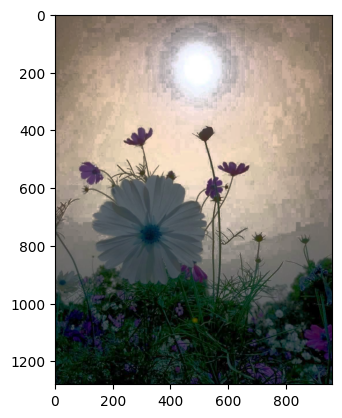

In [42]:
h,s,v = cv2.split(img_hsv)
v = cv2.equalizeHist(v)
merged_hsv = cv2.merge([h,s,v])
plt.imshow(merged_hsv)
plt.show()
img_bgr2 = cv2.cvtColor(merged_hsv,cv2.COLOR_HSV2BGR)
plt.imshow(img_bgr2)
plt.show()

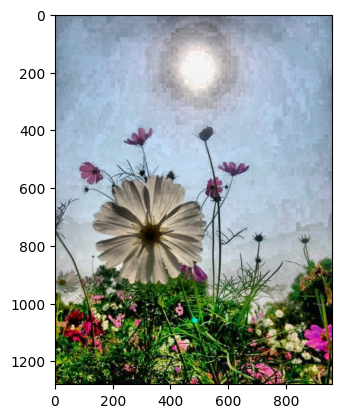

In [47]:
# CLAHE
# BGR to HSV
img_hsv = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
#split the chennel
h,s,v = cv2.split(img_hsv)
#create clahe
clahe = cv2.createCLAHE(clipLimit=5,tileGridSize=(8,8))
v = clahe.apply(v)
img_hsv_clahe = cv2.merge([h,s,v])
img_rgb_clahe = cv2.cvtColor(img_hsv_clahe,cv2.COLOR_HSV2RGB)
plt.imshow(img_rgb_clahe)